In [1]:
%tensorflow_version 1.X

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.X`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.


### Librairies

In [2]:
%matplotlib inline
import pickle as pkl
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.datasets import mnist
import time
from scipy.io import loadmat
import pandas as pd
from matplotlib import pyplot
from keras.utils import to_categorical
import os
os.environ["CUDA_VISIBLE_DEVICES"] = '0'

Using TensorFlow backend.


### Data

11493376/11490434 [==============================] - 2s 0us/step


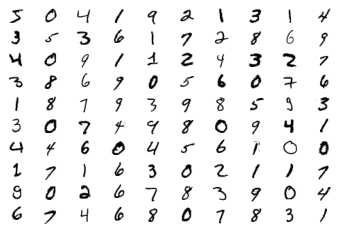

In [3]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()
# plot images from the training dataset
for i in range(100):
	# define subplot
	pyplot.subplot(10, 10, 1 + i)
	# turn off axis
	pyplot.axis('off')
	# plot raw pixel data
	pyplot.imshow(x_train[i], cmap='gray_r')
pyplot.show()

In [4]:
print("train images", x_train.shape) # 60000 images of size 28x28
print("train labels", y_train.shape)
print("test images", x_test.shape) # 10000 images of size 28x28 
print("test labels", y_test.shape)

train images (60000, 28, 28)
train labels (60000,)
test images (10000, 28, 28)
test labels (10000,)


In [5]:
# Normalization

# Making sure that the values are float so that we can get decimal points after division
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

# Normalizing
x_train /= 255
x_test /= 255

# Reshaping the array to 4-dims 
x_train = x_train.reshape(x_train.shape[0], 28, 28, 1)
x_test = x_test.reshape(x_test.shape[0], 28, 28, 1)

#y_train = to_categorical(y_train)
#y_test = to_categorical(y_test)

We create mnist database using a mask_labels to select only 100 labels

In [6]:
class Dataset:
    def __init__(self, shuffle=True):

        self.test_x = x_test
        self.test_y = y_test
        self.train_x, self.train_y = x_train,y_train

        # Select only 100 labels
        self.label_mask = np.zeros_like(self.train_y)
        self.label_mask[0:100] = 1
        self.shuffle = shuffle
        
    def batches(self, batch_size, which_set="train"):
        x_name = which_set + "_x"
        y_name = which_set + "_y"
        # The value of the named attributes
        num_exemples = len(getattr(dataset, y_name))
        if self.shuffle:
            idx = np.arange(num_exemples)
            np.random.shuffle(idx)
            setattr(dataset, x_name, getattr(dataset, x_name)[idx])
            setattr(dataset, y_name, getattr(dataset, y_name)[idx])
            if which_set == "train":
                dataset.label_mask = dataset.label_mask[idx]
        
        dataset_x = getattr(dataset, x_name)
        dataset_y = getattr(dataset, y_name)
        for ii in range(0, num_exemples, batch_size):
            x = dataset_x[ii:ii+batch_size]
            y = dataset_y[ii:ii+batch_size]

            # if mask_labels = 0, the label won't be used
            # if mask_labels = 1, the label will be used
            if which_set == "train":
                yield x, y, self.label_mask[ii:ii+batch_size]
            else:
                yield x, y

We need two inputs: one for the generator and another one for discriminator

In [7]:
def model_inputs(real_dim, z_dim):
    # placeholder for inputing the real images from the training set to the discriminator
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    
    # placeholder for inputing random noise data into the discriminator
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    # placeholder for real labels
    y = tf.placeholder(tf.int32, (None), name='y')
    # placeholder for inputing the label masks which tell the model for which sample images should it take the labels for training
    label_mask = tf.placeholder(tf.int32, (None), name='label_mask')
    
    return inputs_real, inputs_z, y, label_mask

### The generator
The implementation of the Generator consists of taking a random vector z as input. Reshape it to a 4D tensor and then feed it to a sequence of transpose convolutions, Batch Normalization (BN) and leaky ReLU operations.
Wich increases the spatial dimensions of the input vector while reduces its number of channels. As a result, the network outputs a 28x28x1 tensor shape squashed between values of 0 and 1 through the Hyperbolic Tangent Function.

Relu is used as a hidden layer activation function.
The hyperbolic tangent is used for the activation of the output layer.

In [8]:
def generator(z, output_dim, reuse=False, alpha=0.01, training=True, size_mult=128):
    momentum = 0.99
    with tf.variable_scope("generator", reuse=None):
        x = z
        d1 = 4
        d2 = 1
        # First fully connected layer
        x = tf.layers.dense(x, units=d1 * d1 * d2)
        # Batch normalization
        x = tf.contrib.layers.batch_norm(x, is_training=training, decay=momentum)  
        # Leaky ReLU
        x = tf.maximum(alpha * x, x)
        # Reshape it to start the convolutional stack
        x = tf.reshape(x, shape=[-1, d1, d1, d2])
        
        x = tf.image.resize_images(x, size=[7, 7])
        # Convolution layer
        x = tf.layers.conv2d_transpose(x, kernel_size=5, filters=64, strides=2, padding='same')
        # Batch normalisation
        x = tf.contrib.layers.batch_norm(x, is_training=training, decay=momentum)
        # Leaky ReLU
        x = tf.maximum(alpha * x, x)
        # Convolution layer
        x = tf.layers.conv2d_transpose(x, kernel_size=5, filters=64, strides=2, padding='same')
        # Batch normalisation
        x = tf.contrib.layers.batch_norm(x, is_training=training, decay=momentum)
        # Leaky ReLU
        x = tf.maximum(alpha * x, x)
        # Convolution layer
        x = tf.layers.conv2d_transpose(x, kernel_size=5, filters=64, strides=1, padding='same')
        # Batch normalisation
        x = tf.contrib.layers.batch_norm(x, is_training=training, decay=momentum)
        # Leaky ReLU
        x = tf.maximum(alpha * x, x)
        # Convolution layer
        x = tf.layers.conv2d_transpose(x, kernel_size=5, filters=1, strides=1, padding='same')
        
        out = tf.tanh(x)
        return out

### Discriminator
We setup a similar DCGAN architecture in which we use a stack of convolutions for reducing the dimensions of the feature-vectors. To stabilize learning we make extensive use of BN (except the first layer of the network).

The 2D convolution window (kernel or filter) is set to have a width and height of 5 across all the convolutions. Also, we have some layers with dropout. In fact, our discriminator behaves (in part) like any other regular classifier. Because of that, it may suffer from the same problems any classifier would if not well designed.

After a series of convolutions, batch normalization, leaky RELUs and dropout, instead of directly applying a fully connected layer on top of the convolutions, we perform a Global Average Pooling (GAP) operation.

We will transform the GAN discriminator into an 11 class discriminator (0 to 9 and a label for the facke image). It will recognize the 10 different classes of real Mnist numbers, as well as an eleventh class of facke images from the generator.

Relu is used as a hidden layer activation function.
The activation function applied to hidden layers is leaky realu with the alpha parameter to be filled in.

A momentum will be applied during the descent in order not to stuck in local minima, saddle points, or plateau regions.

The hyperbolic tangent is used to activate the output layer.

The drop_out rate (random deactivation of neurons) is 50%. At each iteration (epoch) 50% of the neurons are randomly deactivated to allow a better generalization.

In [9]:
def discriminator(x, reuse=False, alpha=0.01, drop_rate=0.5, num_classes=10, size_mult=64):
  # add a momentum
  momentum = 0.99
  with tf.variable_scope('discriminator', reuse=reuse):
    # reshape
    x = tf.reshape(x, shape=[-1, 28, 28, 1])
    
    x = tf.layers.dropout(x, rate=drop_rate/2.5)
    # Input layer in 28x28x1 format
    x1 = tf.layers.conv2d(x, kernel_size=5, filters=64, strides=2, padding='same')
    # Leaky ReLU
    relu1 = tf.maximum(alpha * x1, x1)
    relu1 = tf.layers.dropout(relu1, rate=drop_rate)
    # Convolution layer
    x2 = tf.layers.conv2d(relu1, kernel_size=5, filters=64, strides=2, padding='same')
    # Batch normalization
    bn2 = tf.layers.batch_normalization(x2, training=True, momentum=momentum)
    # Leaky ReLU
    relu2 = tf.maximum(alpha * bn2, bn2)
    relu2 = tf.layers.dropout(relu2, rate=drop_rate)
    # Convolution layer
    x3 = tf.layers.conv2d(relu2, kernel_size=5, filters=64, strides=2, padding='same')
    # Batch normalization
    bn3 = tf.layers.batch_normalization(x3, training=True, momentum=momentum)
    # Leaky ReLU
    relu3 = tf.maximum(alpha * bn3, bn3)
    relu3 = tf.layers.dropout(relu3, rate=drop_rate)
    # Convolution layer
    x4 = tf.layers.conv2d(relu3, kernel_size=5, filters=64, strides=2, padding='same')
    # Batch normalization
    bn4 = tf.layers.batch_normalization(x4, training=True, momentum=momentum)
    # Leaky ReLU
    relu4 = tf.maximum(alpha * bn4, bn4)
        
    x5 = tf.layers.conv2d(relu4, kernel_size=5, filters=64, strides=1, padding='same')
    # Batch normalization
    bn5 = tf.layers.batch_normalization(x5, training=True, momentum=momentum)
    # Leaky ReLU
    relu5 = tf.maximum(alpha * bn5, bn5)
    # Convolution layer
    x6 = tf.layers.conv2d(relu5, kernel_size=5, filters=64, strides=1, padding='same')
    # Batch normalization
    bn6 = tf.layers.batch_normalization(x6, training=True, momentum=momentum)
    
    # Leaky ReLU
    relu6 = tf.maximum(alpha * bn6, bn6)
    relu6 = tf.layers.dropout(relu6, rate=drop_rate)
    # Convolution layer
    x7 = tf.layers.conv2d(relu6, filters=(size_mult), kernel_size=1, strides=1, padding='valid')
    # Leaky ReLU
    relu7 = tf.maximum(alpha * x7, x7)

    features = tf.reduce_mean(relu7, axis=[1,2])
    
    class_logits = tf.layers.dense(features, num_classes)
    
    gan_logits = tf.reduce_logsumexp(class_logits, 1)

    out = tf.nn.softmax(class_logits)
        
    return out, class_logits, gan_logits, features

In [10]:
def  model_loss(input_real, input_z, output_dim, y, num_classes, label_mask, alpha=0.01, drop_rate=0.5, smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input random noise vector 
    :param output_dim: The number of channels in the output image
    :param y: Integer class labels
    :param num_classes: The number of classes
    :param alpha: The slope of the left half of leaky ReLU activation
    :param drop_rate: The probability of dropping a hidden unit
    :return: A tuple of (discriminator loss, generator loss)
    """
    # To multiply the size of each layer of the generator and the discriminator respectively
    g_size_mult = 32
    d_size_mult = 64
    # Initialise the generator and the discriminator networks
    g_model = generator(input_z, output_dim, alpha=alpha, size_mult=g_size_mult)
    d_on_data = discriminator(input_real, alpha=alpha, drop_rate=drop_rate, size_mult=d_size_mult)
    
    # d_model_real: probability that the input is real
      # class_logits_on_data: the unnormalized log probability values for the probability of each classe
      # gan_logits_on_data: the probability of whether or not the image is real
      # data_features: features from the last layer of the discriminator to be used in the feature matching loss
    d_model_réel, class_logits_classe, gan_logits_on_data, data_features = d_on_data
    
    d_on_samples = discriminator(g_model, reuse=True, alpha=alpha, drop_rate=drop_rate, size_mult=d_size_mult)
    d_model_fake, class_logits_on_samples, gan_logits_on_samples, sample_features = d_on_samples

    # Here we compute `d_loss`, the loss for the discriminator.
      # This should combine two different losses:
      # 1. The loss for the GAN problem, where we minimize the cross-entropy for the binary
      #    real-vs-fake classification problem.
    real_data_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=gan_logits_on_data, 
                                                            labels=tf.ones_like(gan_logits_on_data) * (1 - smooth)))
    
    fake_data_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=gan_logits_on_samples, 
                                                         labels=tf.zeros_like(gan_logits_on_samples)))
    
    unsupervised_loss = real_data_loss + fake_data_loss
    
    #  2. The loss for the SVHN digit classification problem, where we minimize the cross-entropy
    #     for the multi-class softmax. For this one we use the labels. Don't forget to ignore
    #     use `mask_labels` to ignore the examples that we are pretending are unlabeled for the
    #     semi-supervised learning problem.
    y = tf.squeeze(y)
    suppervised_loss = tf.nn.softmax_cross_entropy_with_logits(logits=class_logits_classe,
                                                                  labels=tf.one_hot(y, num_classes, dtype=tf.float32))
    
    label_mask = tf.squeeze(tf.to_float(label_mask))
    
    # ignore the labels that we pretend does not exist for the loss
    suppervised_loss = tf.reduce_sum(tf.multiply(suppervised_loss, label_mask))
    
    # camput the mean
    suppervised_loss = suppervised_loss / tf.maximum(1.0, tf.reduce_sum(label_mask))
    d_loss = unsupervised_loss + suppervised_loss

    data_moments = tf.reduce_mean(data_features, axis=0)
    sample_moments = tf.reduce_mean(sample_features, axis=0)
    g_loss = tf.reduce_mean(tf.abs(data_moments - sample_moments))

    pred_class = tf.cast(tf.argmax(class_logits_classe, 1), tf.int32)
    eq = tf.equal(tf.squeeze(y), pred_class)
    correct = tf.reduce_sum(tf.to_float(eq))
    masked_correct = tf.reduce_sum(label_mask * tf.to_float(eq))
    
    return d_loss, g_loss, correct, masked_correct, g_model, pred_class, unsupervised_loss, suppervised_loss

Optimizer (ADAM)

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # weights and the bias to be updated. They are obtained separately for the generator and the discriminator.
    discriminator_train_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES , scope='discriminator')
    generator_train_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope='generator')
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1, name='d_optimizer').minimize(d_loss, var_list=discriminator_train_vars)
    g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1, name='g_optimizer').minimize(g_loss, var_list=generator_train_vars)

    shrink_lr = tf.assign(learning_rate, learning_rate * 0.9)
    
    return d_train_opt, g_train_opt, shrink_lr

In [12]:
class GAN:
    """
    A GAN model.
    :param real_size: The shape of the real data.
    :param z_size: The number of entries in the z code vector.
    :param learnin_rate: The learning rate to use for Adam.
    :param num_classes: The number of classes to recognize.
    :param alpha: The slope of the left half of the leaky ReLU activation
    :param beta1: The beta1 parameter for Adam.
    """
    def __init__(self, real_size, z_size, learning_rate, num_classes=10, alpha=0.01, beta1=0.5):
        tf.reset_default_graph()
        
        self.learning_rate = tf.Variable(learning_rate, trainable=False)
        inputs = model_inputs(real_size, z_size)
        self.input_real, self.input_z, self.y, self.label_mask = inputs
        self.drop_rate = tf.placeholder_with_default(.5, (), "drop_rate")
        
        loss_results = model_loss(self.input_real, self.input_z,
                                  real_size[2], self.y, num_classes,
                                  label_mask=self.label_mask,
                                  alpha=0.01,
                                  drop_rate=self.drop_rate)
        self.d_loss, self.g_loss, self.correct, self.masked_correct, self.samples, self.pred_class, self.unsupervised_loss, self.suppervised_loss = loss_results
        
        self.d_opt, self.g_opt, self.shrink_lr = model_opt(self.d_loss, self.g_loss, self.learning_rate, beta1)

In [13]:
def train(net, dataset, epochs, batch_size, figsize=(5,5)):
    
    saver = tf.train.Saver()
    sample_z = np.random.normal(0, 1, size=(50, z_size))

    samples, train_accuracies, test_accuracies, loss_generator, loss_discriminator = [], [], [], [], [],
    classe_pred, loss_supervised, loss_unsupervised = [], [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            print("Epoch",e)
            
            t1e = time.time()
            num_exemples = 0
            num_correct = 0
            for x, y, label_mask in dataset.batches(batch_size):
                assert 'int' in str(y.dtype)
                steps += 1
                num_exemples += label_mask.sum()

                # Sample random noise for the generator
                batch_z = np.random.normal(0, 1, size=(batch_size, z_size))

                # Run optimizers
                t1 = time.time()
                g_loss, d_loss,_, _, correct, pred_class, unsupervised_loss, suppervised_loss = sess.run([net.g_loss, net.d_loss,net.d_opt, net.g_opt, net.masked_correct,
                                                        net.pred_class, net.unsupervised_loss, net.suppervised_loss],
                                         feed_dict={net.input_real: x, net.input_z: batch_z,
                                                    net.y : y, net.label_mask : label_mask,net.drop_rate: 0.5})
                
                t2 = time.time()
                num_correct += correct
                
            sess.run([net.shrink_lr])
            
            train_accuracy = num_correct / float(num_exemples)
            print("\t\tClassifier train accuracy : ", train_accuracy, '\n')
            print("\t\tNumber of real labels used for learning", num_exemples, '\n')
            print("\t\tThe loss for the generator", g_loss, '\n')
            print("\t\tThe loss for the discriminator", d_loss,'\n')
            print("\t\tLoss of unsupervised learning", unsupervised_loss,'\n')
            print("\t\tLoss of supervised learning", suppervised_loss,'\n')
            loss_generator.append(g_loss)
            loss_discriminator.append(d_loss)
            classe_pred.append(pred_class)
            loss_unsupervised.append(unsupervised_loss)
            loss_supervised.append(suppervised_loss)
            num_exemples = 0
            num_correct = 0
            for x, y in dataset.batches(batch_size, which_set="test"):
                assert 'int' in str(y.dtype)
                num_exemples += x.shape[0]

                correct, = sess.run([net.correct], feed_dict={net.input_real: x,
                                                   net.y : y,
                                                   net.drop_rate: 0.5})
                num_correct += correct
            
            test_accuracy = num_correct / float(num_exemples)
            t2 = time.time()
            print("\t\tClassifier test accuracy : ", test_accuracy, '\n')
            print("\t\tNumber of real labels used for test", num_exemples, '\n')
            print("\t\tStep time: ", t2 - t1)
            t2e = time.time()
            print("\t\tEpoch time : ", t2e - t1e)
            
            
            gen_samples = sess.run(net.samples,feed_dict={net.input_z: sample_z})
            
            samples.append(gen_samples)
            
            idx = np.random.randint(0, samples[e].shape[0], size=30)           
            fig, axes = plt.subplots(figsize=figsize, nrows = 5, ncols=5, sharex=True, sharey=True)
            for ii, ax in zip(idx, axes.flatten()):
              ax.imshow(samples[e][ii].reshape(28,28), aspect='equal')
              ax.xaxis.set_visible(False)
              ax.yaxis.set_visible(False)
              plt.subplots_adjust(wspace=0, hspace=0)
            plt.show()
            #_ = view_samples(-1, samples, 5, 5, figsize=figsize)
            #plt.show()
            fig.savefig('epoch' + str(e)+ '.png') 
            
            
            # Saves results of training and test
            train_accuracies.append(train_accuracy)
            test_accuracies.append(test_accuracy)
            

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return train_accuracies, test_accuracies, samples, gen_samples, loss_generator, loss_discriminator,classe_pred, loss_unsupervised, loss_supervised

In [15]:
real_size = (28,28,1)
z_size = 100
learning_rate = 0.0003

net = GAN(real_size, z_size, learning_rate)

Results during learning and testing

Epoch 0
		Classifier train accuracy :  0.44 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.36767322 

		The loss for the discriminator 0.49136087 

		Loss of unsupervised learning 0.49136087 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.4896 

		Number of real labels used for test 10000 

		Step time:  0.9104523658752441
		Epoch time :  55.398383378982544


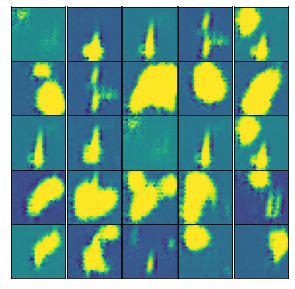

Epoch 1
		Classifier train accuracy :  0.67 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.38288417 

		The loss for the discriminator 0.4138881 

		Loss of unsupervised learning 0.4138881 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.567 

		Number of real labels used for test 10000 

		Step time:  0.5872910022735596
		Epoch time :  47.78701424598694


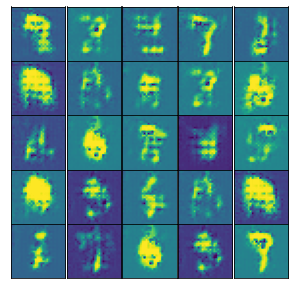

Epoch 2
		Classifier train accuracy :  0.86 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.28945872 

		The loss for the discriminator 0.46208575 

		Loss of unsupervised learning 0.46208575 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.6678 

		Number of real labels used for test 10000 

		Step time:  0.5902354717254639
		Epoch time :  47.833882093429565


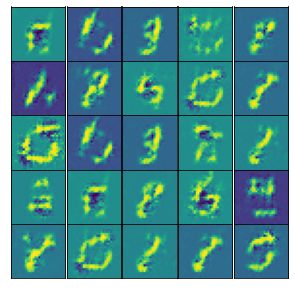

Epoch 3
		Classifier train accuracy :  0.95 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.10164666 

		The loss for the discriminator 0.8141931 

		Loss of unsupervised learning 0.8141931 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.612 

		Number of real labels used for test 10000 

		Step time:  0.5939340591430664
		Epoch time :  47.90571904182434


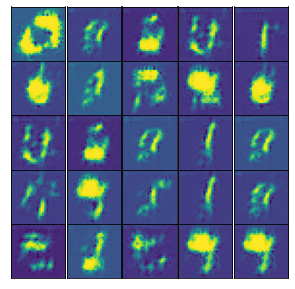

Epoch 4
		Classifier train accuracy :  0.93 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.14068371 

		The loss for the discriminator 0.6598651 

		Loss of unsupervised learning 0.6598651 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.6698 

		Number of real labels used for test 10000 

		Step time:  0.5772922039031982
		Epoch time :  47.626235008239746


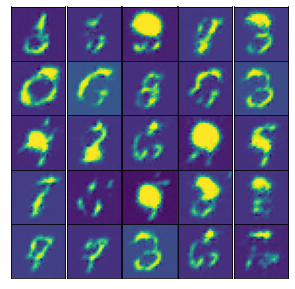

Epoch 5
		Classifier train accuracy :  0.98 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.43572712 

		The loss for the discriminator 0.36122483 

		Loss of unsupervised learning 0.36122483 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7036 

		Number of real labels used for test 10000 

		Step time:  0.5723876953125
		Epoch time :  47.61795997619629


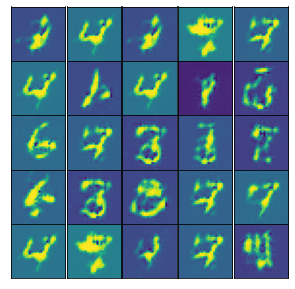

Epoch 6
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.39165345 

		The loss for the discriminator 0.3405286 

		Loss of unsupervised learning 0.3405286 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7514 

		Number of real labels used for test 10000 

		Step time:  0.5879158973693848
		Epoch time :  47.636826515197754


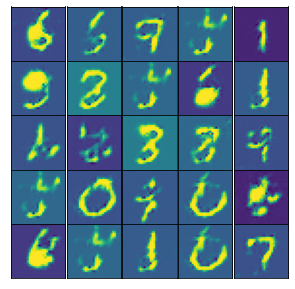

Epoch 7
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.20568681 

		The loss for the discriminator 0.43120548 

		Loss of unsupervised learning 0.43120548 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7641 

		Number of real labels used for test 10000 

		Step time:  0.5749139785766602
		Epoch time :  47.658722162246704


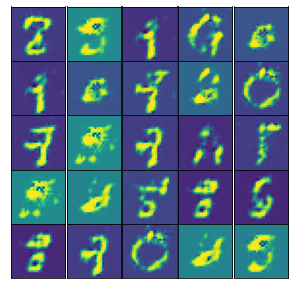

Epoch 8
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.37430903 

		The loss for the discriminator 0.33498752 

		Loss of unsupervised learning 0.33498752 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7738 

		Number of real labels used for test 10000 

		Step time:  0.5840370655059814
		Epoch time :  47.46334147453308


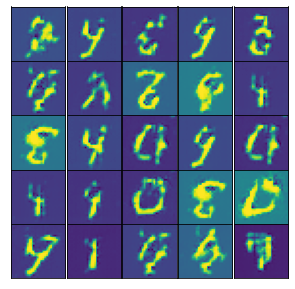

Epoch 9
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.34847146 

		The loss for the discriminator 0.33466706 

		Loss of unsupervised learning 0.33466706 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7777 

		Number of real labels used for test 10000 

		Step time:  0.5647182464599609
		Epoch time :  46.96796774864197


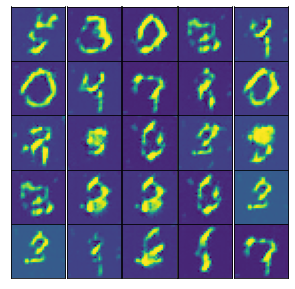

Epoch 10
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4761591 

		The loss for the discriminator 0.3332855 

		Loss of unsupervised learning 0.3332855 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.767 

		Number of real labels used for test 10000 

		Step time:  0.5745887756347656
		Epoch time :  47.5424690246582


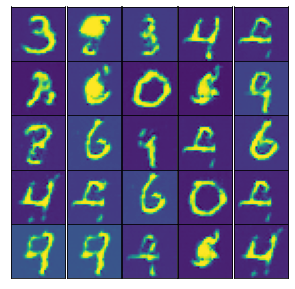

Epoch 11
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.3565349 

		The loss for the discriminator 0.33384556 

		Loss of unsupervised learning 0.33384556 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7817 

		Number of real labels used for test 10000 

		Step time:  0.571958065032959
		Epoch time :  47.52877974510193


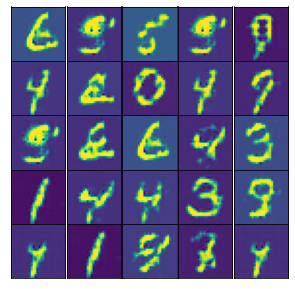

Epoch 12
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.37932718 

		The loss for the discriminator 0.33348766 

		Loss of unsupervised learning 0.33348766 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7858 

		Number of real labels used for test 10000 

		Step time:  0.5777349472045898
		Epoch time :  47.44633650779724


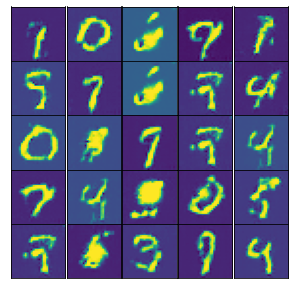

Epoch 13
		Classifier train accuracy :  0.99 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.34294015 

		The loss for the discriminator 0.3577966 

		Loss of unsupervised learning 0.3577966 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7818 

		Number of real labels used for test 10000 

		Step time:  0.5676009654998779
		Epoch time :  47.42530059814453


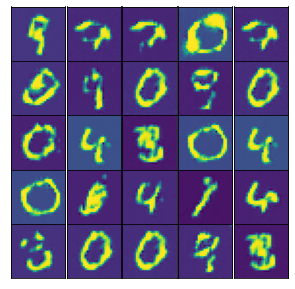

Epoch 14
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.26408303 

		The loss for the discriminator 0.34132385 

		Loss of unsupervised learning 0.34132385 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7712 

		Number of real labels used for test 10000 

		Step time:  0.5694084167480469
		Epoch time :  47.56014943122864


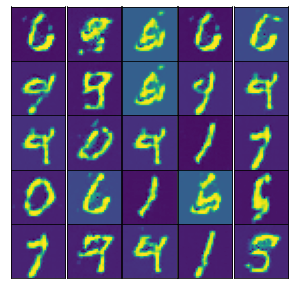

Epoch 15
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.32725888 

		The loss for the discriminator 0.33303794 

		Loss of unsupervised learning 0.33303794 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7642 

		Number of real labels used for test 10000 

		Step time:  0.5652294158935547
		Epoch time :  47.560874462127686


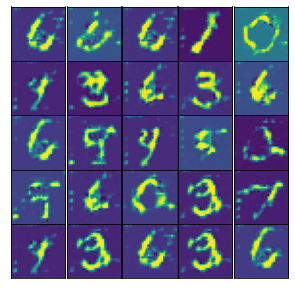

Epoch 16
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.2984197 

		The loss for the discriminator 0.33088005 

		Loss of unsupervised learning 0.33088005 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7715 

		Number of real labels used for test 10000 

		Step time:  0.5699324607849121
		Epoch time :  47.64968681335449


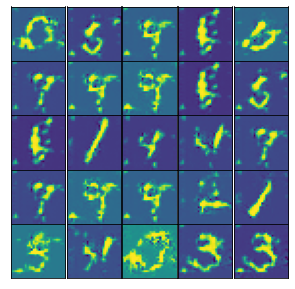

Epoch 17
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.39654016 

		The loss for the discriminator 0.32820067 

		Loss of unsupervised learning 0.32820067 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7707 

		Number of real labels used for test 10000 

		Step time:  0.5814371109008789
		Epoch time :  47.565091371536255


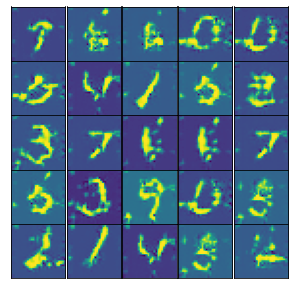

Epoch 18
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.27461857 

		The loss for the discriminator 0.37429366 

		Loss of unsupervised learning 0.37429366 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7677 

		Number of real labels used for test 10000 

		Step time:  0.5801506042480469
		Epoch time :  47.569647550582886


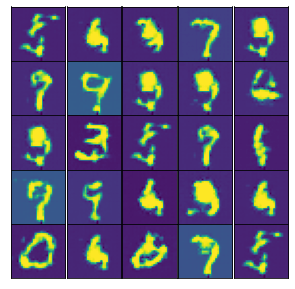

Epoch 19
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.3524749 

		The loss for the discriminator 0.3283174 

		Loss of unsupervised learning 0.3283174 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7627 

		Number of real labels used for test 10000 

		Step time:  0.5748434066772461
		Epoch time :  47.552980184555054


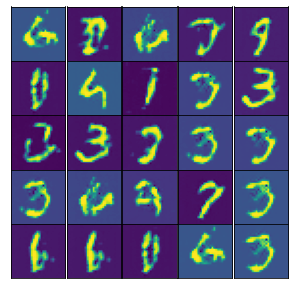

Epoch 20
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.29235524 

		The loss for the discriminator 0.33579165 

		Loss of unsupervised learning 0.33579165 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7432 

		Number of real labels used for test 10000 

		Step time:  0.587465763092041
		Epoch time :  47.58728528022766


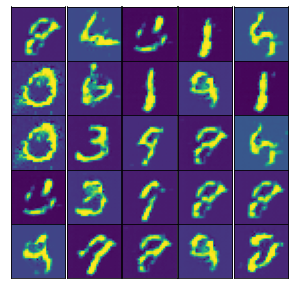

Epoch 21
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.40037212 

		The loss for the discriminator 0.32959884 

		Loss of unsupervised learning 0.32959884 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7697 

		Number of real labels used for test 10000 

		Step time:  0.5875415802001953
		Epoch time :  47.59378480911255


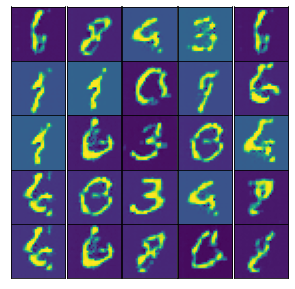

Epoch 22
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.34645796 

		The loss for the discriminator 0.33145657 

		Loss of unsupervised learning 0.33145657 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7699 

		Number of real labels used for test 10000 

		Step time:  0.5830352306365967
		Epoch time :  47.60458016395569


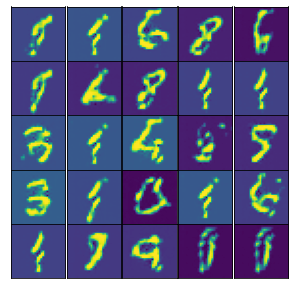

Epoch 23
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.39936784 

		The loss for the discriminator 0.33098224 

		Loss of unsupervised learning 0.33098224 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7673 

		Number of real labels used for test 10000 

		Step time:  0.5665395259857178
		Epoch time :  47.560901165008545


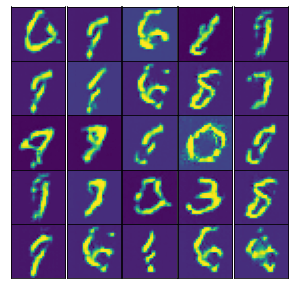

Epoch 24
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.3927773 

		The loss for the discriminator 0.32945976 

		Loss of unsupervised learning 0.32945976 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7652 

		Number of real labels used for test 10000 

		Step time:  0.5814001560211182
		Epoch time :  47.48431706428528


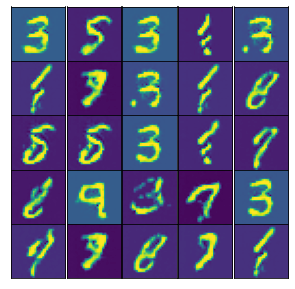

Epoch 25
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.27229267 

		The loss for the discriminator 0.3359403 

		Loss of unsupervised learning 0.3359403 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7805 

		Number of real labels used for test 10000 

		Step time:  0.583660364151001
		Epoch time :  47.59461236000061


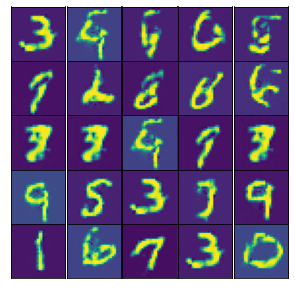

Epoch 26
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.41861677 

		The loss for the discriminator 0.32923934 

		Loss of unsupervised learning 0.32923934 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7854 

		Number of real labels used for test 10000 

		Step time:  0.5705981254577637
		Epoch time :  47.49567413330078


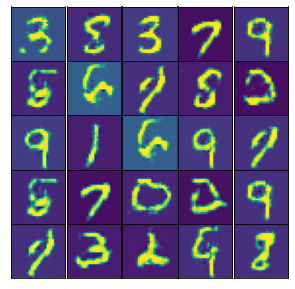

Epoch 27
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.376861 

		The loss for the discriminator 0.328354 

		Loss of unsupervised learning 0.328354 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7706 

		Number of real labels used for test 10000 

		Step time:  0.5864970684051514
		Epoch time :  47.62512421607971


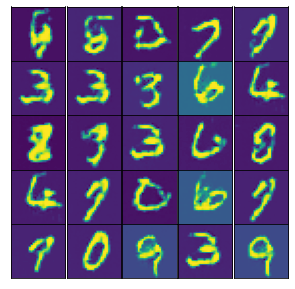

Epoch 28
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.47938037 

		The loss for the discriminator 0.32831982 

		Loss of unsupervised learning 0.32831982 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.771 

		Number of real labels used for test 10000 

		Step time:  0.57999587059021
		Epoch time :  47.65328550338745


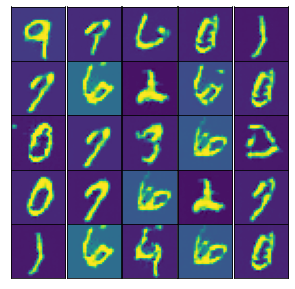

Epoch 29
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4608603 

		The loss for the discriminator 0.32901433 

		Loss of unsupervised learning 0.32836223 

		Loss of supervised learning 0.00065210054 

		Classifier test accuracy :  0.7719 

		Number of real labels used for test 10000 

		Step time:  0.5729169845581055
		Epoch time :  47.57974410057068


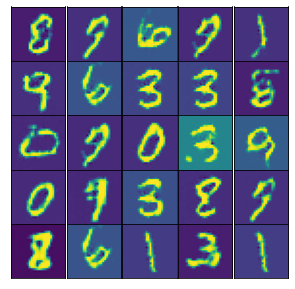

Epoch 30
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.40455145 

		The loss for the discriminator 0.33029437 

		Loss of unsupervised learning 0.33029437 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7653 

		Number of real labels used for test 10000 

		Step time:  0.5779972076416016
		Epoch time :  47.59826683998108


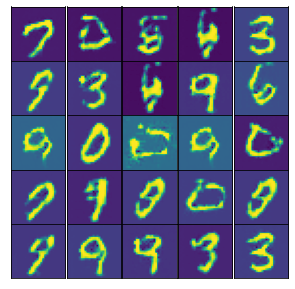

Epoch 31
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4887321 

		The loss for the discriminator 0.327339 

		Loss of unsupervised learning 0.327339 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.765 

		Number of real labels used for test 10000 

		Step time:  0.5708436965942383
		Epoch time :  47.46042323112488


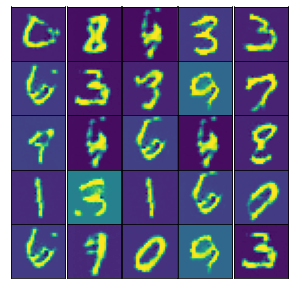

Epoch 32
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.29815418 

		The loss for the discriminator 0.3313511 

		Loss of unsupervised learning 0.3313511 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7712 

		Number of real labels used for test 10000 

		Step time:  0.5576097965240479
		Epoch time :  47.64629912376404


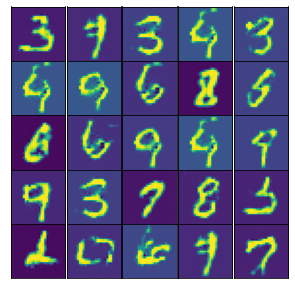

Epoch 33
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4656067 

		The loss for the discriminator 0.33011892 

		Loss of unsupervised learning 0.32735482 

		Loss of supervised learning 0.002764097 

		Classifier test accuracy :  0.7713 

		Number of real labels used for test 10000 

		Step time:  0.5775959491729736
		Epoch time :  47.677592515945435


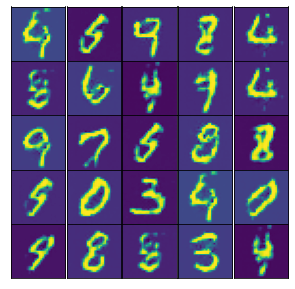

Epoch 34
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.47304744 

		The loss for the discriminator 0.3289745 

		Loss of unsupervised learning 0.3289745 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7698 

		Number of real labels used for test 10000 

		Step time:  0.5755605697631836
		Epoch time :  47.588815689086914


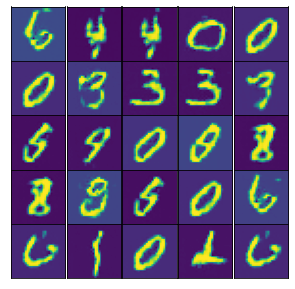

Epoch 35
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4232508 

		The loss for the discriminator 0.32647067 

		Loss of unsupervised learning 0.32647067 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7671 

		Number of real labels used for test 10000 

		Step time:  0.584589958190918
		Epoch time :  47.68069624900818


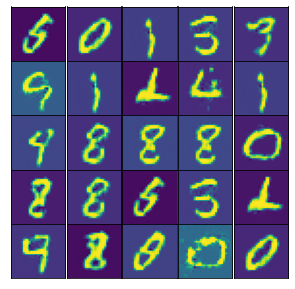

Epoch 36
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.43894032 

		The loss for the discriminator 0.32695872 

		Loss of unsupervised learning 0.32695872 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7663 

		Number of real labels used for test 10000 

		Step time:  0.5769538879394531
		Epoch time :  47.659083127975464


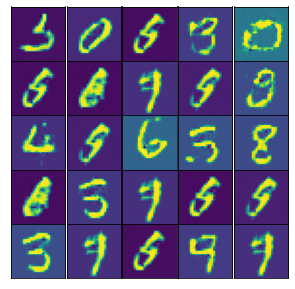

Epoch 37
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.37729344 

		The loss for the discriminator 0.32684022 

		Loss of unsupervised learning 0.32684022 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7667 

		Number of real labels used for test 10000 

		Step time:  0.5725269317626953
		Epoch time :  47.58117127418518


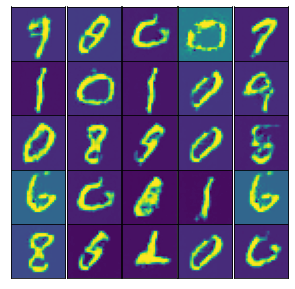

Epoch 38
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.39762598 

		The loss for the discriminator 0.3271987 

		Loss of unsupervised learning 0.3271987 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7666 

		Number of real labels used for test 10000 

		Step time:  0.572016716003418
		Epoch time :  47.550128698349


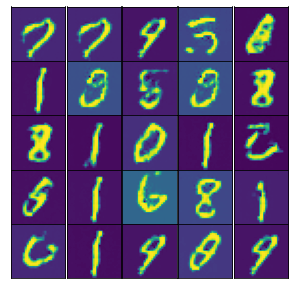

Epoch 39
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.41865844 

		The loss for the discriminator 0.32607478 

		Loss of unsupervised learning 0.32607478 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7663 

		Number of real labels used for test 10000 

		Step time:  0.5662143230438232
		Epoch time :  47.535959005355835


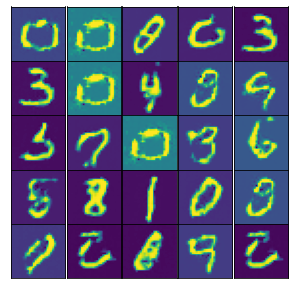

Epoch 40
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4335593 

		The loss for the discriminator 0.32620156 

		Loss of unsupervised learning 0.32620156 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7669 

		Number of real labels used for test 10000 

		Step time:  0.5820281505584717
		Epoch time :  47.57146644592285


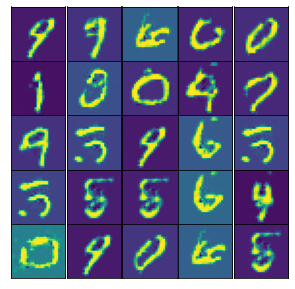

Epoch 41
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.42622918 

		The loss for the discriminator 0.33029425 

		Loss of unsupervised learning 0.33029425 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7653 

		Number of real labels used for test 10000 

		Step time:  0.5913333892822266
		Epoch time :  47.55900168418884


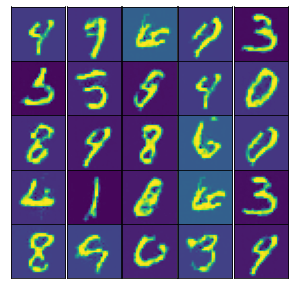

Epoch 42
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.41466635 

		The loss for the discriminator 0.32825297 

		Loss of unsupervised learning 0.3267685 

		Loss of supervised learning 0.0014844838 

		Classifier test accuracy :  0.7659 

		Number of real labels used for test 10000 

		Step time:  0.570009708404541
		Epoch time :  47.586360692977905


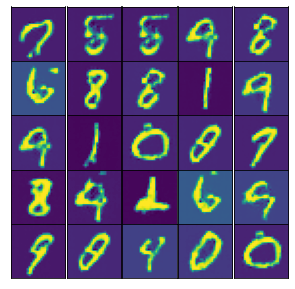

Epoch 43
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.49527788 

		The loss for the discriminator 0.3258593 

		Loss of unsupervised learning 0.3258593 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7609 

		Number of real labels used for test 10000 

		Step time:  0.5814378261566162
		Epoch time :  47.52484107017517


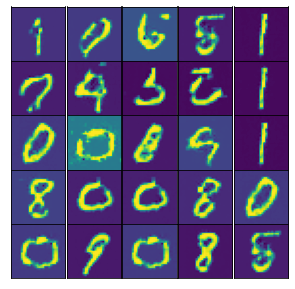

Epoch 44
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.47385752 

		The loss for the discriminator 0.32655913 

		Loss of unsupervised learning 0.32655913 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7619 

		Number of real labels used for test 10000 

		Step time:  0.5658161640167236
		Epoch time :  47.5323429107666


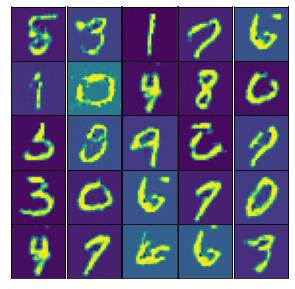

Epoch 45
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.47162327 

		The loss for the discriminator 0.32616365 

		Loss of unsupervised learning 0.32598415 

		Loss of supervised learning 0.00017951308 

		Classifier test accuracy :  0.7644 

		Number of real labels used for test 10000 

		Step time:  0.5593879222869873
		Epoch time :  47.507046699523926


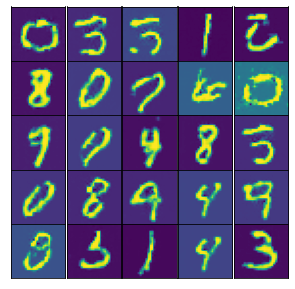

Epoch 46
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.39668795 

		The loss for the discriminator 0.32593215 

		Loss of unsupervised learning 0.32593215 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7636 

		Number of real labels used for test 10000 

		Step time:  0.5758390426635742
		Epoch time :  47.57831144332886


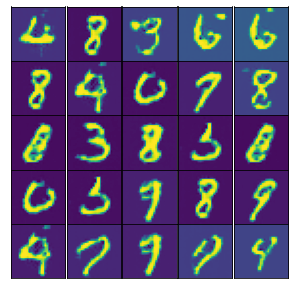

Epoch 47
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5060001 

		The loss for the discriminator 0.32814407 

		Loss of unsupervised learning 0.32814407 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7637 

		Number of real labels used for test 10000 

		Step time:  0.5708162784576416
		Epoch time :  47.55314373970032


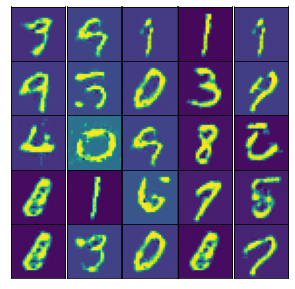

Epoch 48
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4680722 

		The loss for the discriminator 0.32657346 

		Loss of unsupervised learning 0.32657346 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7657 

		Number of real labels used for test 10000 

		Step time:  0.5739045143127441
		Epoch time :  47.52824568748474


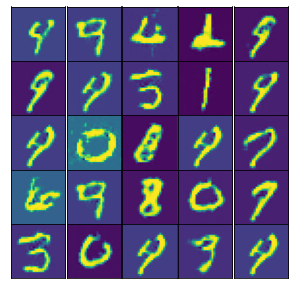

Epoch 49
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5102769 

		The loss for the discriminator 0.3261412 

		Loss of unsupervised learning 0.3261412 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7605 

		Number of real labels used for test 10000 

		Step time:  0.5896666049957275
		Epoch time :  47.526684045791626


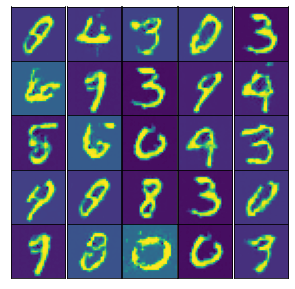

Epoch 50
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4856599 

		The loss for the discriminator 0.3258913 

		Loss of unsupervised learning 0.3258913 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7637 

		Number of real labels used for test 10000 

		Step time:  0.5706040859222412
		Epoch time :  47.5600860118866


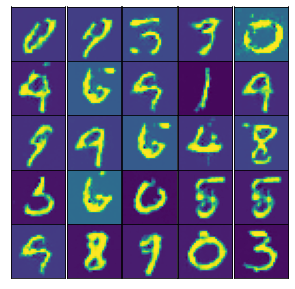

Epoch 51
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.46966586 

		The loss for the discriminator 0.3256776 

		Loss of unsupervised learning 0.3256776 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7604 

		Number of real labels used for test 10000 

		Step time:  0.5745537281036377
		Epoch time :  47.5527069568634


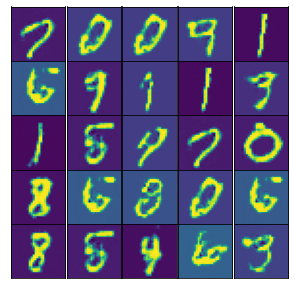

Epoch 52
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5694289 

		The loss for the discriminator 0.33229175 

		Loss of unsupervised learning 0.32632658 

		Loss of supervised learning 0.005965168 

		Classifier test accuracy :  0.7639 

		Number of real labels used for test 10000 

		Step time:  0.5728254318237305
		Epoch time :  47.62766242027283


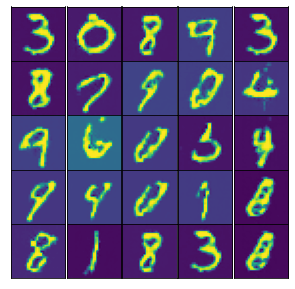

Epoch 53
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.41759115 

		The loss for the discriminator 0.32633647 

		Loss of unsupervised learning 0.32633647 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7655 

		Number of real labels used for test 10000 

		Step time:  0.5804812908172607
		Epoch time :  47.600939989089966


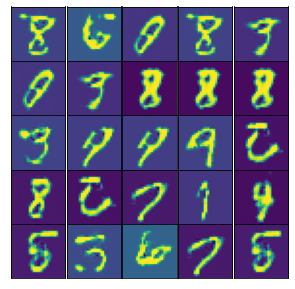

Epoch 54
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5253701 

		The loss for the discriminator 0.3337891 

		Loss of unsupervised learning 0.3337891 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7654 

		Number of real labels used for test 10000 

		Step time:  0.5811655521392822
		Epoch time :  47.58172369003296


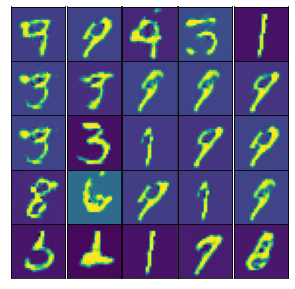

Epoch 55
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.41146564 

		The loss for the discriminator 0.3266206 

		Loss of unsupervised learning 0.3266206 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7619 

		Number of real labels used for test 10000 

		Step time:  0.5748844146728516
		Epoch time :  47.45572328567505


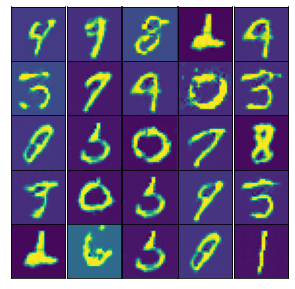

Epoch 56
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4134353 

		The loss for the discriminator 0.32594892 

		Loss of unsupervised learning 0.32594892 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7624 

		Number of real labels used for test 10000 

		Step time:  0.5543656349182129
		Epoch time :  47.411141872406006


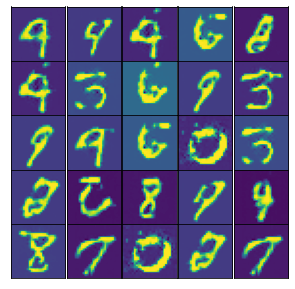

Epoch 57
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.53227234 

		The loss for the discriminator 0.32744625 

		Loss of unsupervised learning 0.32744625 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7638 

		Number of real labels used for test 10000 

		Step time:  0.5640239715576172
		Epoch time :  47.116294145584106


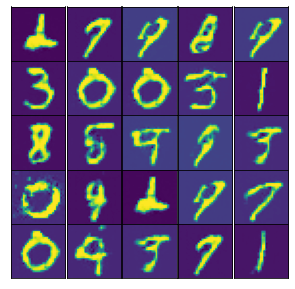

Epoch 58
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.46872097 

		The loss for the discriminator 0.32821512 

		Loss of unsupervised learning 0.32592857 

		Loss of supervised learning 0.00228656 

		Classifier test accuracy :  0.7623 

		Number of real labels used for test 10000 

		Step time:  0.5576291084289551
		Epoch time :  47.15674304962158


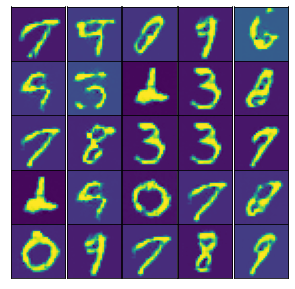

Epoch 59
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.47474527 

		The loss for the discriminator 0.326932 

		Loss of unsupervised learning 0.32605717 

		Loss of supervised learning 0.00087485183 

		Classifier test accuracy :  0.7633 

		Number of real labels used for test 10000 

		Step time:  0.5577137470245361
		Epoch time :  47.165249824523926


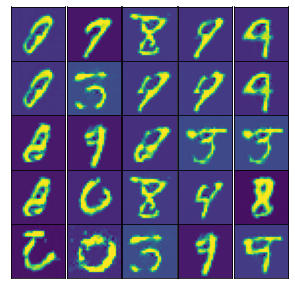

Epoch 60
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.44071096 

		The loss for the discriminator 0.32590926 

		Loss of unsupervised learning 0.32590926 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7625 

		Number of real labels used for test 10000 

		Step time:  0.571404218673706
		Epoch time :  47.03583908081055


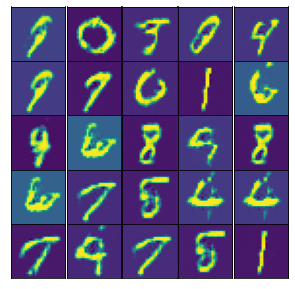

Epoch 61
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.48974586 

		The loss for the discriminator 0.32627025 

		Loss of unsupervised learning 0.32627025 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7626 

		Number of real labels used for test 10000 

		Step time:  0.5667049884796143
		Epoch time :  47.09631371498108


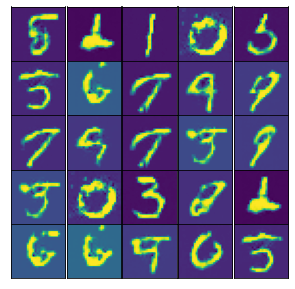

Epoch 62
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.45093715 

		The loss for the discriminator 0.3256043 

		Loss of unsupervised learning 0.3256043 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7623 

		Number of real labels used for test 10000 

		Step time:  0.5589370727539062
		Epoch time :  47.10299301147461


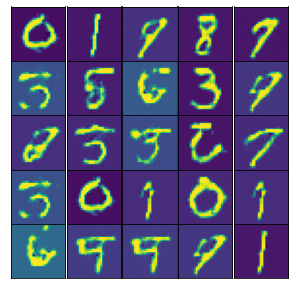

Epoch 63
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.45550779 

		The loss for the discriminator 0.32601592 

		Loss of unsupervised learning 0.32601592 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7625 

		Number of real labels used for test 10000 

		Step time:  0.5619161128997803
		Epoch time :  46.99767255783081


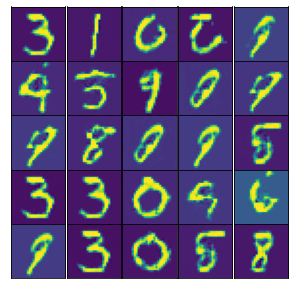

Epoch 64
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4409565 

		The loss for the discriminator 0.32671583 

		Loss of unsupervised learning 0.3263306 

		Loss of supervised learning 0.0003852102 

		Classifier test accuracy :  0.7628 

		Number of real labels used for test 10000 

		Step time:  0.5921690464019775
		Epoch time :  47.07848644256592


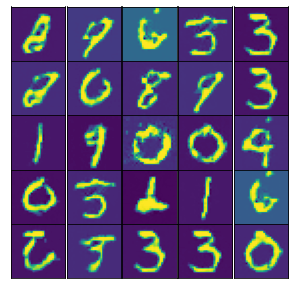

Epoch 65
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.46532342 

		The loss for the discriminator 0.3255982 

		Loss of unsupervised learning 0.3255982 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7624 

		Number of real labels used for test 10000 

		Step time:  0.5480971336364746
		Epoch time :  46.88664793968201


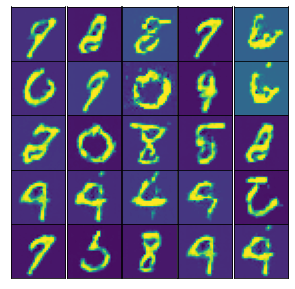

Epoch 66
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5523982 

		The loss for the discriminator 0.32810637 

		Loss of unsupervised learning 0.32810637 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.762 

		Number of real labels used for test 10000 

		Step time:  0.5647358894348145
		Epoch time :  46.811232566833496


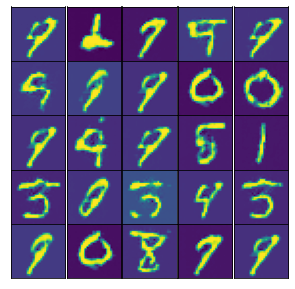

Epoch 67
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5119004 

		The loss for the discriminator 0.32638654 

		Loss of unsupervised learning 0.32638654 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7633 

		Number of real labels used for test 10000 

		Step time:  0.5520198345184326
		Epoch time :  46.739683866500854


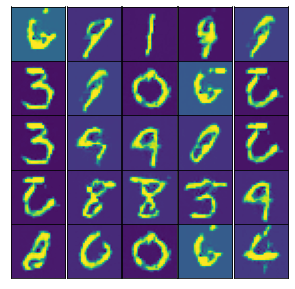

Epoch 68
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.44585115 

		The loss for the discriminator 0.32586896 

		Loss of unsupervised learning 0.32586896 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7635 

		Number of real labels used for test 10000 

		Step time:  0.5595424175262451
		Epoch time :  47.13721680641174


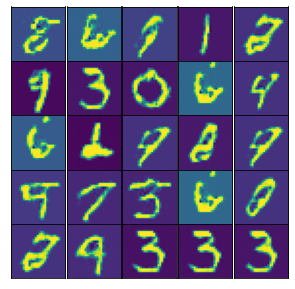

Epoch 69
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.3987778 

		The loss for the discriminator 0.32661897 

		Loss of unsupervised learning 0.32661897 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7637 

		Number of real labels used for test 10000 

		Step time:  0.5568900108337402
		Epoch time :  47.02774930000305


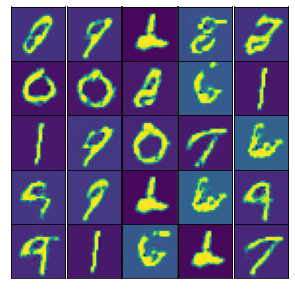

Epoch 70
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.47394514 

		The loss for the discriminator 0.32589814 

		Loss of unsupervised learning 0.32589814 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7625 

		Number of real labels used for test 10000 

		Step time:  0.5850064754486084
		Epoch time :  47.202295780181885


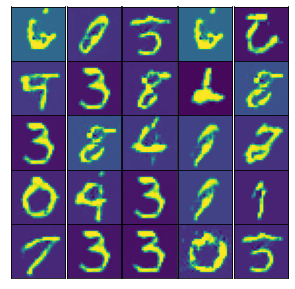

Epoch 71
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.48212254 

		The loss for the discriminator 0.3276282 

		Loss of unsupervised learning 0.3276282 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7613 

		Number of real labels used for test 10000 

		Step time:  0.5522418022155762
		Epoch time :  47.14943051338196


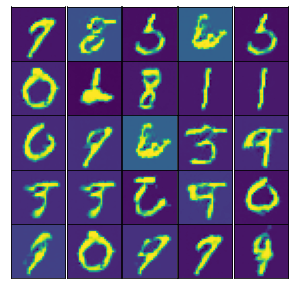

Epoch 72
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5539043 

		The loss for the discriminator 0.3267229 

		Loss of unsupervised learning 0.3267229 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7631 

		Number of real labels used for test 10000 

		Step time:  0.5611259937286377
		Epoch time :  47.15954923629761


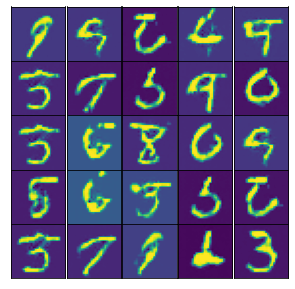

Epoch 73
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.39830443 

		The loss for the discriminator 0.32590348 

		Loss of unsupervised learning 0.32590348 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7624 

		Number of real labels used for test 10000 

		Step time:  0.5824589729309082
		Epoch time :  47.17258143424988


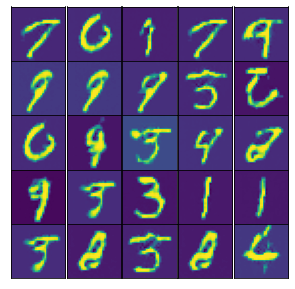

Epoch 74
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4559611 

		The loss for the discriminator 0.32580754 

		Loss of unsupervised learning 0.32580754 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7623 

		Number of real labels used for test 10000 

		Step time:  0.5566322803497314
		Epoch time :  47.12426018714905


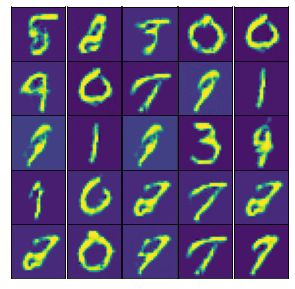

Epoch 75
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.37723553 

		The loss for the discriminator 0.32592323 

		Loss of unsupervised learning 0.32592323 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7606 

		Number of real labels used for test 10000 

		Step time:  0.5592763423919678
		Epoch time :  47.11681509017944


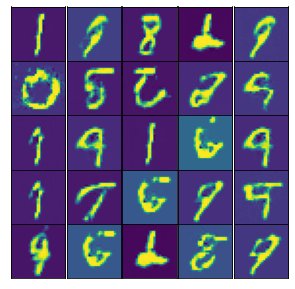

Epoch 76
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.44593477 

		The loss for the discriminator 0.32682136 

		Loss of unsupervised learning 0.32682136 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7618 

		Number of real labels used for test 10000 

		Step time:  0.5741028785705566
		Epoch time :  47.19374942779541


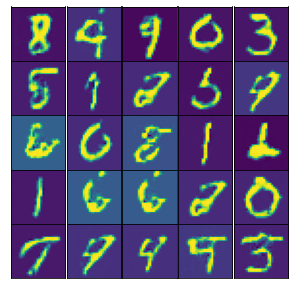

Epoch 77
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.3939221 

		The loss for the discriminator 0.32768565 

		Loss of unsupervised learning 0.32768565 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7604 

		Number of real labels used for test 10000 

		Step time:  0.5637757778167725
		Epoch time :  47.258888244628906


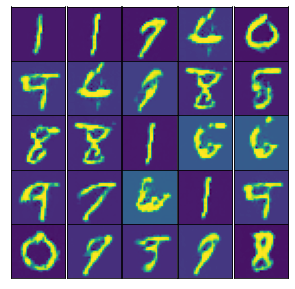

Epoch 78
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4721589 

		The loss for the discriminator 0.3261285 

		Loss of unsupervised learning 0.3261285 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7617 

		Number of real labels used for test 10000 

		Step time:  0.5812795162200928
		Epoch time :  47.26014018058777


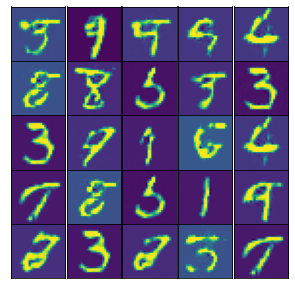

Epoch 79
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.46510196 

		The loss for the discriminator 0.3260873 

		Loss of unsupervised learning 0.3260873 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7624 

		Number of real labels used for test 10000 

		Step time:  0.5536751747131348
		Epoch time :  47.25174140930176


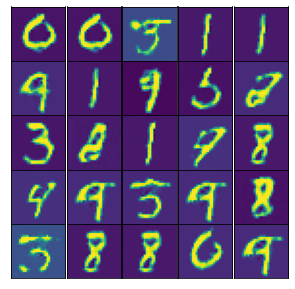

Epoch 80
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5395353 

		The loss for the discriminator 0.3273057 

		Loss of unsupervised learning 0.3259268 

		Loss of supervised learning 0.0013788964 

		Classifier test accuracy :  0.7622 

		Number of real labels used for test 10000 

		Step time:  0.5550413131713867
		Epoch time :  47.188050270080566


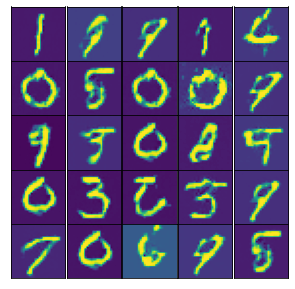

Epoch 81
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4597874 

		The loss for the discriminator 0.3255672 

		Loss of unsupervised learning 0.3255672 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7612 

		Number of real labels used for test 10000 

		Step time:  0.5608720779418945
		Epoch time :  47.21356153488159


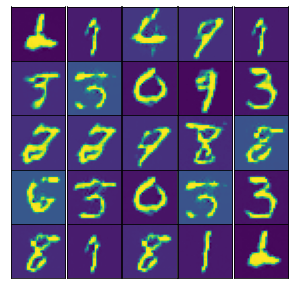

Epoch 82
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5404757 

		The loss for the discriminator 0.3271588 

		Loss of unsupervised learning 0.3271588 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7605 

		Number of real labels used for test 10000 

		Step time:  0.5563383102416992
		Epoch time :  47.15110778808594


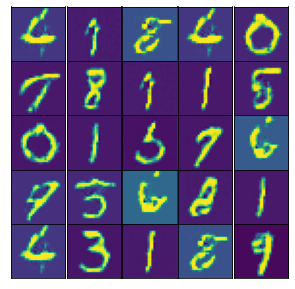

Epoch 83
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.47636402 

		The loss for the discriminator 0.32667643 

		Loss of unsupervised learning 0.32626525 

		Loss of supervised learning 0.0004111875 

		Classifier test accuracy :  0.7628 

		Number of real labels used for test 10000 

		Step time:  0.5784599781036377
		Epoch time :  47.13295650482178


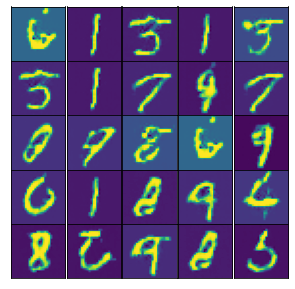

Epoch 84
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.48963493 

		The loss for the discriminator 0.3274471 

		Loss of unsupervised learning 0.32615247 

		Loss of supervised learning 0.0012946089 

		Classifier test accuracy :  0.7645 

		Number of real labels used for test 10000 

		Step time:  0.5620028972625732
		Epoch time :  47.24752378463745


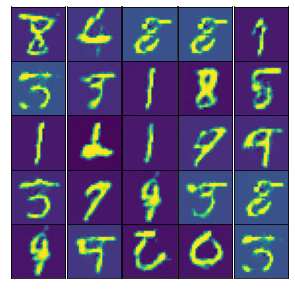

Epoch 85
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.42364383 

		The loss for the discriminator 0.32615423 

		Loss of unsupervised learning 0.32615423 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7636 

		Number of real labels used for test 10000 

		Step time:  0.5537285804748535
		Epoch time :  47.183788537979126


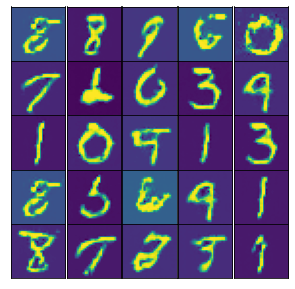

Epoch 86
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.48660406 

		The loss for the discriminator 0.3261895 

		Loss of unsupervised learning 0.3261895 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7653 

		Number of real labels used for test 10000 

		Step time:  0.5685250759124756
		Epoch time :  47.104151487350464


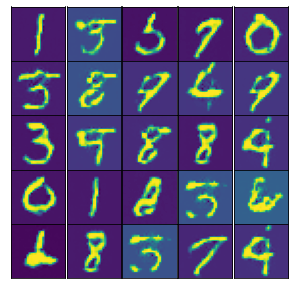

Epoch 87
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5016774 

		The loss for the discriminator 0.32572308 

		Loss of unsupervised learning 0.32572308 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7613 

		Number of real labels used for test 10000 

		Step time:  0.5526766777038574
		Epoch time :  47.07102560997009


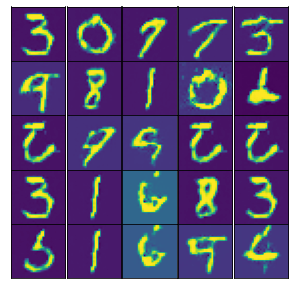

Epoch 88
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.46660542 

		The loss for the discriminator 0.32632792 

		Loss of unsupervised learning 0.32632792 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7629 

		Number of real labels used for test 10000 

		Step time:  0.555072546005249
		Epoch time :  47.09805464744568


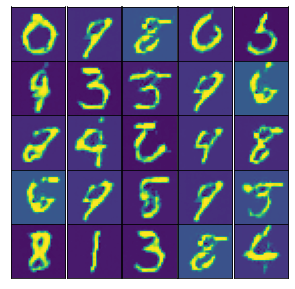

Epoch 89
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5085124 

		The loss for the discriminator 0.32577947 

		Loss of unsupervised learning 0.32577947 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7635 

		Number of real labels used for test 10000 

		Step time:  0.5507650375366211
		Epoch time :  47.09203004837036


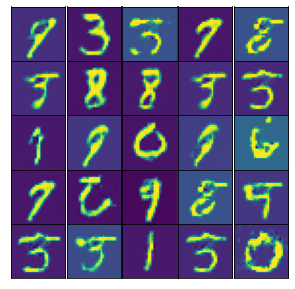

Epoch 90
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.48812783 

		The loss for the discriminator 0.32754248 

		Loss of unsupervised learning 0.32579342 

		Loss of supervised learning 0.0017490579 

		Classifier test accuracy :  0.7634 

		Number of real labels used for test 10000 

		Step time:  0.5598623752593994
		Epoch time :  47.21283268928528


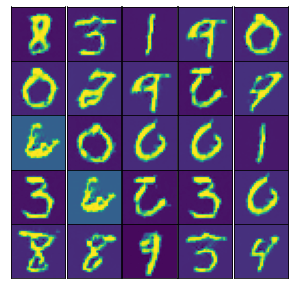

Epoch 91
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4736957 

		The loss for the discriminator 0.32582214 

		Loss of unsupervised learning 0.32582214 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7639 

		Number of real labels used for test 10000 

		Step time:  0.5650284290313721
		Epoch time :  47.23504304885864


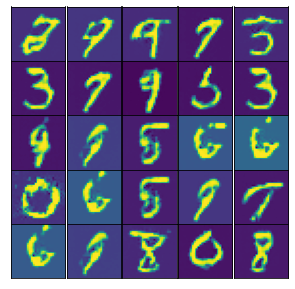

Epoch 92
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.53174853 

		The loss for the discriminator 0.32594812 

		Loss of unsupervised learning 0.32594812 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7603 

		Number of real labels used for test 10000 

		Step time:  0.5727157592773438
		Epoch time :  47.26195740699768


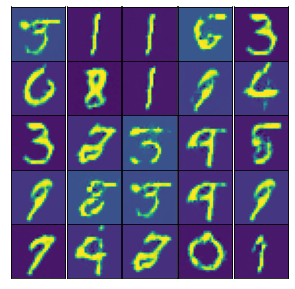

Epoch 93
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5093615 

		The loss for the discriminator 0.3269202 

		Loss of unsupervised learning 0.3269202 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7624 

		Number of real labels used for test 10000 

		Step time:  0.5734806060791016
		Epoch time :  47.22194743156433


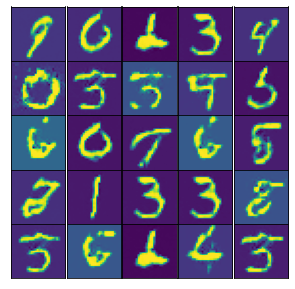

Epoch 94
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.48070073 

		The loss for the discriminator 0.3264811 

		Loss of unsupervised learning 0.3264811 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7642 

		Number of real labels used for test 10000 

		Step time:  0.5822052955627441
		Epoch time :  47.222655057907104


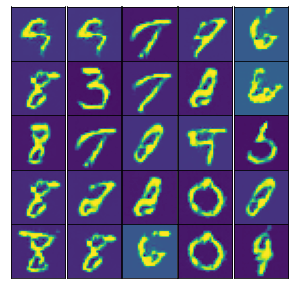

Epoch 95
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4907508 

		The loss for the discriminator 0.32590255 

		Loss of unsupervised learning 0.32590255 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7628 

		Number of real labels used for test 10000 

		Step time:  0.5610921382904053
		Epoch time :  47.193485498428345


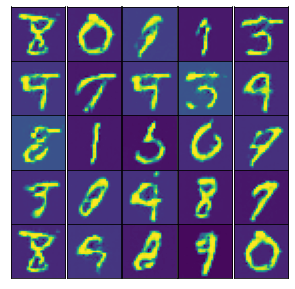

Epoch 96
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.50314796 

		The loss for the discriminator 0.3259806 

		Loss of unsupervised learning 0.3259806 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7617 

		Number of real labels used for test 10000 

		Step time:  0.5749757289886475
		Epoch time :  47.151443004608154


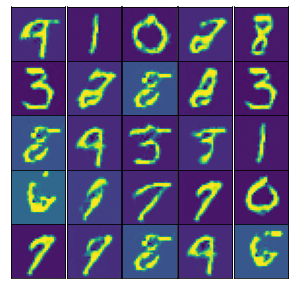

Epoch 97
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.42832524 

		The loss for the discriminator 0.32594863 

		Loss of unsupervised learning 0.32594863 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7634 

		Number of real labels used for test 10000 

		Step time:  0.5660815238952637
		Epoch time :  47.202516078948975


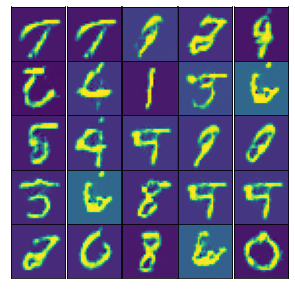

Epoch 98
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.5118358 

		The loss for the discriminator 0.3257785 

		Loss of unsupervised learning 0.3257785 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7639 

		Number of real labels used for test 10000 

		Step time:  0.5617151260375977
		Epoch time :  47.32508659362793


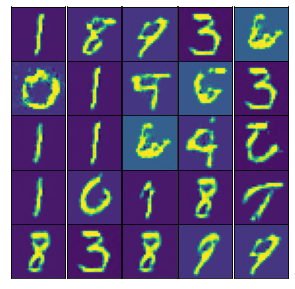

Epoch 99
		Classifier train accuracy :  1.0 

		Number of real labels used for learning 100.0 

		The loss for the generator 0.4730106 

		The loss for the discriminator 0.3276032 

		Loss of unsupervised learning 0.3276032 

		Loss of supervised learning 0.0 

		Classifier test accuracy :  0.7596 

		Number of real labels used for test 10000 

		Step time:  0.5792698860168457
		Epoch time :  47.191157817840576


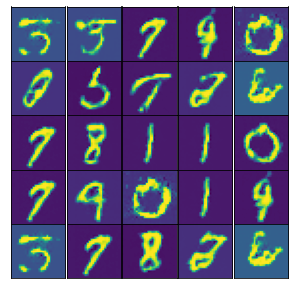

In [16]:
dataset = Dataset()
batch_size = 128
epochs = 100

train_accuracies, test_accuracies, samples, gen, loss_generator,  loss_discriminator, classe_pred, loss_unsupervised, loss_supervised= train(net,
                                                   dataset,
                                                   epochs,
                                                   batch_size,
                                                   figsize=(5,5))

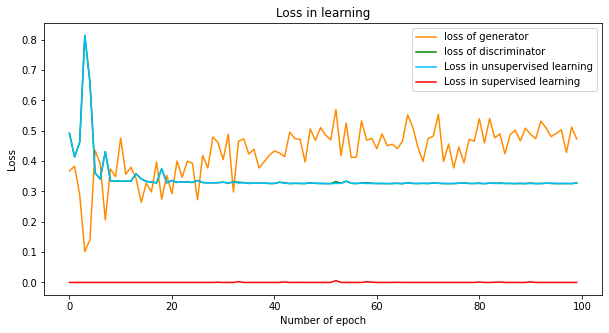

In [17]:
# Representation of loss
plt.figure(figsize=(10,5))
plt.plot(loss_generator, label="loss of generator", color='darkorange')
plt.plot(loss_discriminator, label="loss of discriminator", color='green')
plt.plot(loss_unsupervised, label="Loss in unsupervised learning", color='deepskyblue')
plt.plot(loss_supervised, label="Loss in supervised learning", color='red')
plt.ylabel("Loss")
plt.xlabel("Number of epoch")
plt.title("Loss in learning")
plt.legend()
#fig.savefig('apprentisage_loss.png') 